# Ranking 25KB genomic regions: Chr 11

In [ ]:
%pip install statsmodels

In [1]:
import sys
import os
import pandas as pd, numpy as np, seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gamma
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster import hierarchy
import math
from scipy import stats
from scipy.stats import poisson
from sklearn.preprocessing import LabelEncoder
import pylab

In [9]:
pd.set_option('display.max_rows', None) 

In [10]:
biosamples = 733
num_components = 16
num_dhs = 3591898
calls = pd.read_csv('../results/calls',sep='\t',header=None)
vocab = pd.read_csv('../../dhs_data/DHS_Index_and_Vocabulary_hg38_WM20190703.txt',sep='\t')
clr_scheme = {'Placental / trophoblast': '#FFE500', 'Lymphoid': '#FE8102', 'Myeloid / erythroid': '#FF0000', 'Cardiac': '#07AF00','Musculoskeletal': '#4C7D14', 'Vascular / endothelial': '#414613', 'Primitive / embryonic': '#05C1D9', 'Neural': '#0467FD', 'Digestive': '#009588','Stromal A': '#BB2DD4', 'Stromal B': '#7A00FF', 'Renal / cancer': '#4A6876', 'Cancer / epithelial': '#08245B', 'Pulmonary devel.': '#B9461D','Organ devel. / renal': '#692108', 'Tissue invariant': '#C3C3C3'}


/tmp/ipykernel_161182/1579890819.py:5: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  vocab = pd.read_csv('../../dhs_data/DHS_Index_and_Vocabulary_hg38_WM20190703.txt',sep='\t')


###  Evaluating component distribution in a region

In [28]:
chr11_ce=pd.read_csv('../results/genome_25kb/chr11_component_enrichment',sep='\t')
chr11_ce=chr11_ce.drop('Unnamed: 19',axis=1)

In [29]:
chr11_ce.head()

,seqname,start,end,Tissue invariant,Placental / trophoblast,Neural,Primitive / embryonic,Digestive,Lymphoid,Musculoskeletal,Stromal B,Myeloid / erythroid,Cancer / epithelial,Pulmonary devel.,Renal / cancer,Stromal A,Organ devel. / renal,Vascular / endothelial,Cardiac
0,chr11,88400,113400,-inf,-inf,-inf,-inf,-inf,-inf,-inf,-inf,0.489769,-inf,-inf,-inf,-inf,-inf,-inf,-inf
1,chr11,134600,159600,-inf,-inf,-inf,-2.842529,-inf,-inf,-inf,-inf,-inf,-inf,-inf,-inf,-inf,-inf,-inf,-inf
2,chr11,168200,193200,-inf,-0.016041,-1.401382,-1.257567,-inf,-0.096574,-inf,-inf,0.489769,-inf,-0.141761,-inf,-inf,-0.865390,-inf,-inf
3,chr11,193200,218200,1.732934,0.398996,-inf,1.681033,0.272004,2.018904,1.857814,-0.627663,2.074732,-1.109601,-inf,-0.722061,0.636597,1.719573,0.042301,-inf
4,chr11,231200,256200,2.147971,0.983959,-inf,1.157471,0.856967,-0.096574,-0.312111,-2.212625,-0.095193,-0.109601,-0.141761,-0.722061,-inf,-inf,0.042301,-0.444493


### Replacing all -inf values with minimum from the dataset for visialization (not used here)

In [36]:
chr11_ce.replace([np.inf, -np.inf], -(chr11_ce.iloc[:,3:].max().max()), inplace=True)

In [37]:
chr11_ce.head()

,seqname,start,end,Tissue invariant,Placental / trophoblast,Neural,Primitive / embryonic,Digestive,Lymphoid,Musculoskeletal,Stromal B,Myeloid / erythroid,Cancer / epithelial,Pulmonary devel.,Renal / cancer,Stromal A,Organ devel. / renal,Vascular / endothelial,Cardiac
0,chr11,88400,113400,-4.396660,-4.396660,-4.396660,-4.396660,-4.396660,-4.396660,-4.396660,-4.396660,0.489769,-4.396660,-4.396660,-4.396660,-4.396660,-4.396660,-4.396660,-4.396660
1,chr11,134600,159600,-4.396660,-4.396660,-4.396660,-2.842529,-4.396660,-4.396660,-4.396660,-4.396660,-4.396660,-4.396660,-4.396660,-4.396660,-4.396660,-4.396660,-4.396660,-4.396660
2,chr11,168200,193200,-4.396660,-0.016041,-1.401382,-1.257567,-4.396660,-0.096574,-4.396660,-4.396660,0.489769,-4.396660,-0.141761,-4.396660,-4.396660,-0.865390,-4.396660,-4.396660
3,chr11,193200,218200,1.732934,0.398996,-4.396660,1.681033,0.272004,2.018904,1.857814,-0.627663,2.074732,-1.109601,-4.396660,-0.722061,0.636597,1.719573,0.042301,-4.396660
4,chr11,231200,256200,2.147971,0.983959,-4.396660,1.157471,0.856967,-0.096574,-0.312111,-2.212625,-0.095193,-0.109601,-0.141761,-0.722061,-4.396660,-4.396660,0.042301,-0.444493


### Take the max enrichment to score the component distribution for each region

In [52]:
chr11_ce.iloc[chr11_ce.iloc[:,3:].max(axis=1).sort_values(ascending=False).index,:].reset_index()

,index,seqname,start,end,Tissue invariant,Placental / trophoblast,Neural,Primitive / embryonic,Digestive,Lymphoid,Musculoskeletal,Stromal B,Myeloid / erythroid,Cancer / epithelial,Pulmonary devel.,Renal / cancer,Stromal A,Organ devel. / renal,Vascular / endothelial,Cardiac
0,1049,chr11,33857600,33882600,-0.852029,-0.016041,0.183580,0.157471,-4.396660,-1.681536,-1.312111,-2.212625,4.396660,-1.109601,-4.396660,-0.722061,-4.396660,0.134610,0.042301,-4.396660
1,3288,chr11,109643800,109668800,-0.852029,-4.396660,1.058049,-1.842529,-4.396660,-4.396660,0.272852,-2.212625,-4.396660,4.282717,-0.141761,-4.396660,-4.396660,-4.396660,0.042301,-0.444493
2,3126,chr11,104409400,104434400,-0.852029,0.398996,-1.401382,-0.520601,-0.727996,-0.681536,-1.312111,-0.627663,-4.396660,0.475362,-4.396660,-4.396660,-4.396660,-4.396660,0.042301,4.140470
3,3589,chr11,119358800,119383800,0.147971,1.398996,-0.816420,1.157471,1.593932,1.777895,0.687889,-0.627663,1.226735,-0.109601,-4.396660,0.277939,0.636597,1.456538,-4.396660,3.877435
4,3425,chr11,114158800,114183800,0.732934,-4.396660,1.846545,-1.257567,0.856967,1.640392,1.272852,1.372337,1.489769,-0.109601,0.858239,0.862902,0.636597,0.134610,-4.396660,3.877435
5,2875,chr11,96324600,96349600,1.147971,1.206351,-0.079454,-0.520601,-0.727996,0.903426,-4.396660,1.372337,-1.095193,-1.109601,0.858239,0.862902,0.636597,1.134610,0.042301,3.877435
6,3346,chr11,111601400,111626400,0.732934,-0.601004,-0.401382,-0.842529,0.272004,-4.396660,-4.396660,0.594729,-0.095193,3.797290,-0.141761,0.862902,-4.396660,-4.396660,-4.396660,-4.396660
7,56,chr11,1907200,1932200,-0.852029,-0.601004,-1.401382,0.157471,-0.727996,2.125819,3.775352,-2.212625,0.904807,-4.396660,-0.141761,-0.722061,0.636597,2.304535,-4.396660,-4.396660
8,2927,chr11,98045800,98070800,-4.396660,-0.016041,-0.816420,-1.257567,0.856967,-4.396660,-1.312111,-2.212625,-1.095193,3.748380,-4.396660,-4.396660,-4.396660,0.134610,1.042301,-4.396660
9,3315,chr11,110504400,110529400,-4.396660,-4.396660,-1.401382,0.857910,-4.396660,-4.396660,1.857814,0.787375,-4.396660,3.748380,2.180167,1.599868,1.636597,-0.865390,-4.396660,-0.444493


### Evaluation of quality of a region using the Concordance Metric
It is evaluated as the mean of the cosine similarities between the distribution of a DHS' NMF loadings and all of its constituent biosamples' NMF loadings. We z-score the metric at each value of the number of samples it has to obtain a version more independent of it.

#### The metric rewards DHSs that have high concordance in terms of distribution of NMF loadings of the DHS and its corresponding biosamples

In [14]:
z_conc=pd.read_csv('../results/zscored_concordance_metric',sep='\t')#Distribution of the metric on the entire DHS data
print(np.mean(z_conc.iloc[:,0]))
print(np.std(z_conc.iloc[:,0]))

1.4893582773374859e-15
1.0000000000016285


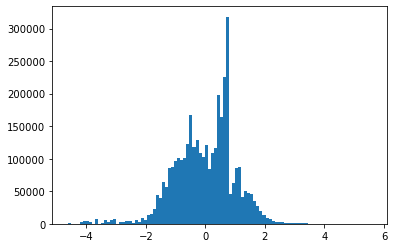

In [58]:
a=plt.hist(z_conc.iloc[:,0],bins=100)

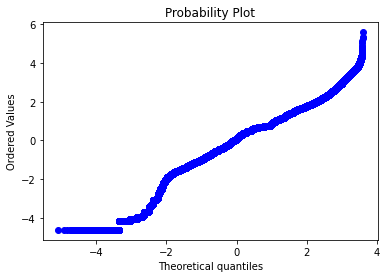

In [69]:
a=stats.probplot(z_conc.iloc[:,0],dist='norm',plot=pylab)

#### Extracting all chr11 DHSs and distribution of concordance metric on chr11

-0.006065582734458941
0.9819101222790272
175850


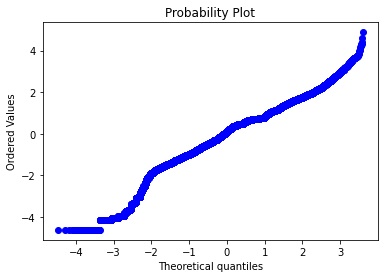

In [56]:
x = np.where(vocab.seqname=='chr11')[0]
print(np.mean(z_conc.iloc[x,0]))
print(np.std(z_conc.iloc[x,0]))
print(len(x))
a=stats.probplot(z_conc.iloc[x,0],dist='norm',plot=pylab)

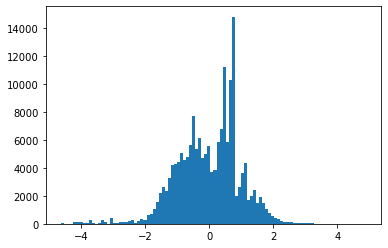

In [52]:
a=plt.hist(z_conc.iloc[x,0],bins=100)

### Distribution of the metric on chromosome 11 (the population from which we sample 25kb regions) is clearly not Normal, the quantile plot is not on a straight line. The population std. deviation is 0.9819101222790272; according to Central Limit Theorem for a sample of size n from this population, the std deviation should be 0.9819101222790272/sqrt(n)

In [53]:
chr11_info = pd.read_csv('../results/genome_25kb/chr11_info_concordance',sep='\t')

In [54]:
chr11_info.head()

,seqname,start,end,no_of_dhs,sum_zscored_concordance_metric,mean_zscored_concordance_metric,std_zscored_concordance_metric,sum_of_ranks,mean_ranks,no_of_unique_components,variance_comp
0,chr11,88400,113400,3,-0.384694,-0.128231,0.727659,5808997,1.936332e+06,1,0.000000
1,chr11,134600,159600,1,-0.860183,-0.860183,0.000000,2898846,2.898846e+06,1,0.000000
2,chr11,168200,193200,16,-1.650832,-0.103177,0.924869,30196177,1.887261e+06,7,3.964844
3,chr11,193200,218200,79,-58.221037,-0.736975,0.714761,211281187,2.674445e+06,13,8.399936
4,chr11,231200,256200,47,-0.298650,-0.006354,0.763733,83001517,1.765990e+06,13,9.521050


#### The histogram and the quantile plot of the 25kb sample regions from chr11 are more Normal than the entire chromosome 11

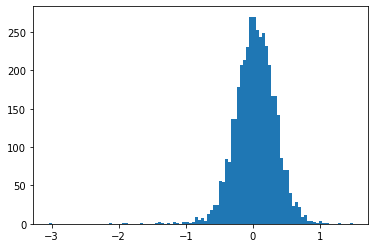

In [71]:
a=plt.hist(chr11_info.mean_zscored_concordance_metric,bins=100)

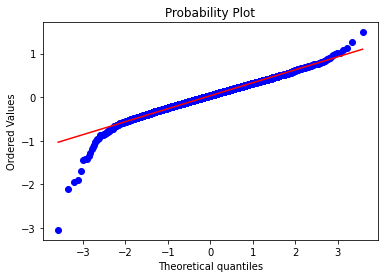

In [59]:
a=stats.probplot(chr11_info.mean_zscored_concordance_metric,dist='norm',plot=pylab)

 #### The difference between the std deviation of the metric of a region and expected according to Central Limit Theorem is used to rank the regions as under:

In [69]:
chr11_info.iloc[(chr11_info.std_zscored_concordance_metric - 0.9819101222790272/np.sqrt(chr11_info.no_of_dhs)).sort_values(ascending=False).index,:].reset_index()

,index,seqname,start,end,no_of_dhs,sum_zscored_concordance_metric,mean_zscored_concordance_metric,std_zscored_concordance_metric,sum_of_ranks,mean_ranks,no_of_unique_components,variance_comp
0,1601,chr11,55432000,55457000,4,-1.151018,-0.287755,2.246820e+00,5407575,1.351894e+06,4,1.250000
1,1606,chr11,55583600,55608600,24,-32.158480,-1.339937,1.818342e+00,58167186,2.423633e+06,5,0.901042
2,4051,chr11,134175800,134200800,22,-3.362725,-0.152851,1.822209e+00,37891730,1.722351e+06,8,7.818182
3,910,chr11,29404400,29429400,8,-6.323982,-0.790498,1.955027e+00,16204031,2.025504e+06,6,2.609375
4,902,chr11,29130800,29155800,12,-2.243940,-0.186995,1.776110e+00,20206567,1.683881e+06,5,1.083333
5,2772,chr11,92988400,93013400,21,-13.147308,-0.626062,1.696636e+00,42721939,2.034378e+06,9,6.848073
6,1691,chr11,58362800,58387800,4,-3.442328,-0.860582,1.958431e+00,8735300,2.183825e+06,3,0.687500
7,1587,chr11,54969000,54994000,2,-2.825697,-1.412848,2.149452e+00,4312053,2.156026e+06,2,0.250000
8,699,chr11,22514600,22539600,15,3.323092,0.221539,1.706118e+00,20876131,1.391742e+06,7,3.795556
9,718,chr11,23133600,23158600,22,-14.690707,-0.667759,1.661451e+00,47167782,2.143990e+06,9,6.489669


### Evaluating quality of a region using unbiased coranking using SNR and Mean Cosine Simialrity(MCS)

In [16]:
coranks3=pd.read_csv('../results/coranked_metrics3',sep='\t')#DHSs ranked according to mean co-ranks of SNR and MCS
chr11_info1 = pd.read_csv('../results/genome_25kb/chr11_info_coranks3',sep='\t')
print(np.mean(coranks3.iloc[:,0]))
print(np.std(coranks3.iloc[:,0]))

1795949.5
751906.9786031414


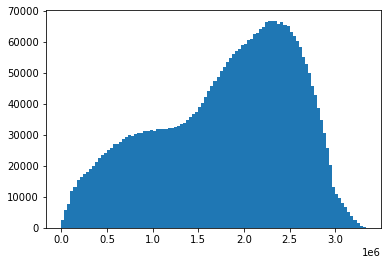

In [19]:
a=plt.hist(coranks3.iloc[:,0],bins=100)

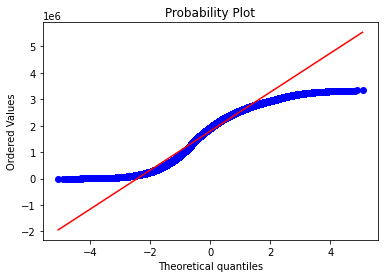

In [67]:
a=stats.probplot(coranks3.iloc[:,0],dist='norm',plot=pylab)

In [29]:
chr11_info1.head()

,seqname,start,end,no_of_dhs,sum_coranked_metrics3,mean_coranked_metrics3,std_coranked_metrics3,sum_of_ranks,mean_ranks,no_of_unique_components,variance_comp
0,chr11,88400,113400,3,3793896.0,1.264632e+06,190649.059589,2803952,9.346507e+05,1,0.000000
1,chr11,134600,159600,1,1765417.5,1.765418e+06,0.000000,1531456,1.531456e+06,1,0.000000
2,chr11,168200,193200,16,31770799.5,1.985675e+06,769532.416010,33505740,2.094109e+06,7,3.964844
3,chr11,193200,218200,79,186899359.0,2.365815e+06,505162.808291,209092083,2.646735e+06,13,8.399936
4,chr11,231200,256200,47,101638756.0,2.162527e+06,629498.129610,110144998,2.343511e+06,13,9.521050


#### Distribution of mean coranks on chromosome 11

1766746.102934319
703823.7675343672


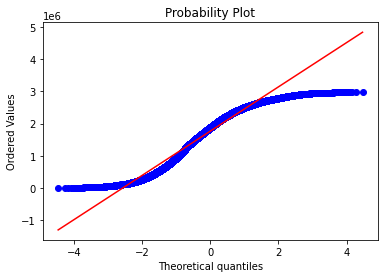

In [72]:
x = np.where(vocab.seqname=='chr11')[0]
print(np.mean(coranks3.iloc[x,0]))
print(np.std(coranks3.iloc[x,0]))
a=stats.probplot(coranks3.iloc[x,0],dist='norm',plot=pylab)

### Again, coranks on sample regions of 25kb are more Normally distributed

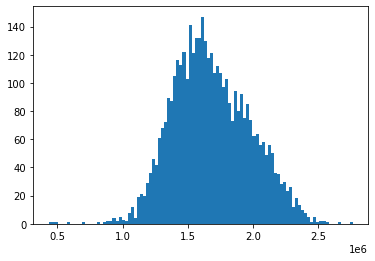

In [23]:
a=plt.hist(chr11_info1.mean_coranked_metrics3,bins=100)

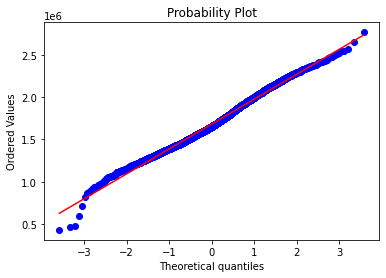

In [62]:
a=stats.probplot(chr11_info1.mean_coranked_metrics3,dist='norm',plot=pylab)

### Ranking according to departure of std deviation from CLT. The population from which samples are drawn is not Normal. So ranking is done based on this difference

In [65]:
chr11_info1.iloc[(chr11_info1.std_coranked_metrics3 - 703823.7675343672/np.sqrt(chr11_info1.no_of_dhs)).sort_values(ascending=False).index,:].reset_index()

,index,seqname,start,end,no_of_dhs,sum_coranked_metrics3,mean_coranked_metrics3,std_coranked_metrics3,sum_of_ranks,mean_ranks,no_of_unique_components,variance_comp
0,3951,chr11,130892400,130917400,38,61842901.0,1.627445e+06,893322.843129,62403089,1.642187e+06,15,18.207756
1,2118,chr11,71912400,71937400,47,87324148.5,1.857961e+06,872675.306600,92225817,1.962251e+06,13,15.871435
2,2212,chr11,74926000,74951000,43,68902459.0,1.602383e+06,877100.691131,68467227,1.592261e+06,12,9.452677
3,3555,chr11,118292600,118317600,44,77098273.5,1.752233e+06,869046.352185,79809472,1.813852e+06,12,10.976756
4,2074,chr11,70397200,70422200,46,79603475.5,1.730510e+06,861766.490563,81031439,1.761553e+06,13,8.969754
5,3759,chr11,124798800,124823800,47,75070842.5,1.597252e+06,855499.580631,74109476,1.576797e+06,12,8.221820
6,3233,chr11,107907200,107932200,35,61501479.0,1.757185e+06,868902.522583,63734888,1.820997e+06,10,5.905306
7,3767,chr11,125091400,125116400,34,59920225.5,1.762360e+06,865655.283078,62142436,1.827719e+06,12,9.498270
8,1665,chr11,57545200,57570200,34,59967449.0,1.763748e+06,865141.347441,61336468,1.804014e+06,14,16.868512
9,509,chr11,16356000,16381000,37,49651836.5,1.341942e+06,857482.260938,46243518,1.249825e+06,13,13.884587


## Departure of std deviation from expected using CLT is not necessarily closer to Normality. Shapiro Wilk test (which is also not conclusive proof of Normality) could be used as corroborative evidence.

## Co-ranking based on quality of DHSs in a region according unbiased co-ranking metric and component distribution as described above

In [105]:
x=chr11_ce.iloc[chr11_ce.iloc[:,3:].max(axis=1).sort_values(ascending=False).index,:].reset_index()
y=chr11_info1.iloc[(chr11_info1.std_coranked_metrics3 - 703823.7675343672/np.sqrt(chr11_info1.no_of_dhs)).sort_values(ascending=False).index,:].reset_index()


In [106]:
chr11_corank_quality_density_component_distribution = chr11_info[['seqname','start','end','no_of_dhs']].copy()
for i in chr11_info.index:
    chr11_corank_quality_density_component_distribution.loc[i,'mean_corank']=(np.where(x.iloc[:,0]==i)[0][0]+np.where(y.iloc[:,0]==i)[0][0])/2

In [108]:
chr11_corank_quality_density_component_distribution.sort_values(by='mean_corank').reset_index()

,index,seqname,start,end,no_of_dhs,mean_corank
0,601,chr11,19418200,19443200,84,76.5
1,3873,chr11,128449600,128474600,68,97.0
2,3937,chr11,130469400,130494400,58,100.5
3,1050,chr11,33882600,33907600,56,119.5
4,1776,chr11,61080000,61105000,56,126.5
5,3808,chr11,126404800,126429800,66,140.5
6,2118,chr11,71912400,71937400,47,148.5
7,3946,chr11,130744400,130769400,47,169.5
8,2125,chr11,72129400,72154400,44,176.5
9,2409,chr11,81014800,81039800,48,186.5


### Some Results based on coranking above

In [ ]:
https://index.altius.org/?application=viewer&mode=pd&chrLeft=chr11&chrRight=chr11&start=33877600&stop=33912599&gatt=cv&gac=off
https://index.altius.org/?application=viewer&mode=pd&chrLeft=chr11&chrRight=chr11&start=128444600&stop=128479599&gatt=cv&gac=off
https://index.altius.org/?application=viewer&mode=pd&chrLeft=chr11&chrRight=chr11&start=130464400&stop=130499399&gatt=cv&gac=off
https://index.altius.org/?application=viewer&mode=pd&chrLeft=chr11&chrRight=chr11&start=126399800&stop=126434799&gatt=cv&gac=off

#### The results above indicate that coranking of component distribution and quality of DHSs in a given 25kb genomic region select regions that are relatively homogenous in terms of NMF components and its constituent DHSs have relatively stronger representation in biosamples of the same NMF components.